In [1]:
# Importing the Libraries

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pickle
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler,RobustScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import model_selection
from sklearn.metrics import accuracy_score,r2_score,mean_squared_error,classification_report
from sklearn.model_selection import GridSearchCV,cross_val_score
import plotly.express as px
%matplotlib inline

### Data Collection and Analysis

In [2]:
# Loading the dataset

data = pd.read_csv("diabetes.csv")
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,2,138,62,35,0,33.6,0.127,47,1
1,0,84,82,31,125,38.2,0.233,23,0
2,0,145,0,0,0,44.2,0.630,31,1
3,0,135,68,42,250,42.3,0.365,24,1
4,1,139,62,41,480,40.7,0.536,21,0
...,...,...,...,...,...,...,...,...,...
1995,2,75,64,24,55,29.7,0.370,33,0
1996,8,179,72,42,130,32.7,0.719,36,1
1997,6,85,78,0,0,31.2,0.382,42,0
1998,0,129,110,46,130,67.1,0.319,26,1


In [3]:
# Data information i.e. data type and column 

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               2000 non-null   int64  
 1   Glucose                   2000 non-null   int64  
 2   BloodPressure             2000 non-null   int64  
 3   SkinThickness             2000 non-null   int64  
 4   Insulin                   2000 non-null   int64  
 5   BMI                       2000 non-null   float64
 6   DiabetesPedigreeFunction  2000 non-null   float64
 7   Age                       2000 non-null   int64  
 8   Outcome                   2000 non-null   int64  
dtypes: float64(2), int64(7)
memory usage: 140.8 KB


In [4]:
# Statistical information about the data diabetes

data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,3.703500,121.182500,69.145500,20.935000,80.254000,32.193000,0.470930,33.090500,0.342000
std,3.306063,32.068636,19.188315,16.103243,111.180534,8.149901,0.323553,11.786423,0.474498
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,63.500000,0.000000,0.000000,27.375000,0.244000,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,40.000000,32.300000,0.376000,29.000000,0.000000
75%,6.000000,141.000000,80.000000,32.000000,130.000000,36.800000,0.624000,40.000000,1.000000
max,17.000000,199.000000,122.000000,110.000000,744.000000,80.600000,2.420000,81.000000,1.000000


In [5]:
# To check the missing value in the dataset

data.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [6]:
data["Outcome"].value_counts()

0    1316
1     684
Name: Outcome, dtype: int64

In [7]:
data.groupby("Outcome").mean()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Outcome,,,,,,,,
0,3.168693,110.586626,68.094985,20.052432,70.563830,30.567477,0.434676,31.081307
1,4.732456,141.568713,71.166667,22.633041,98.897661,35.320468,0.540681,36.956140


In [8]:
# Importing the plotly library

import plotly.io as pio
pio.templates

Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

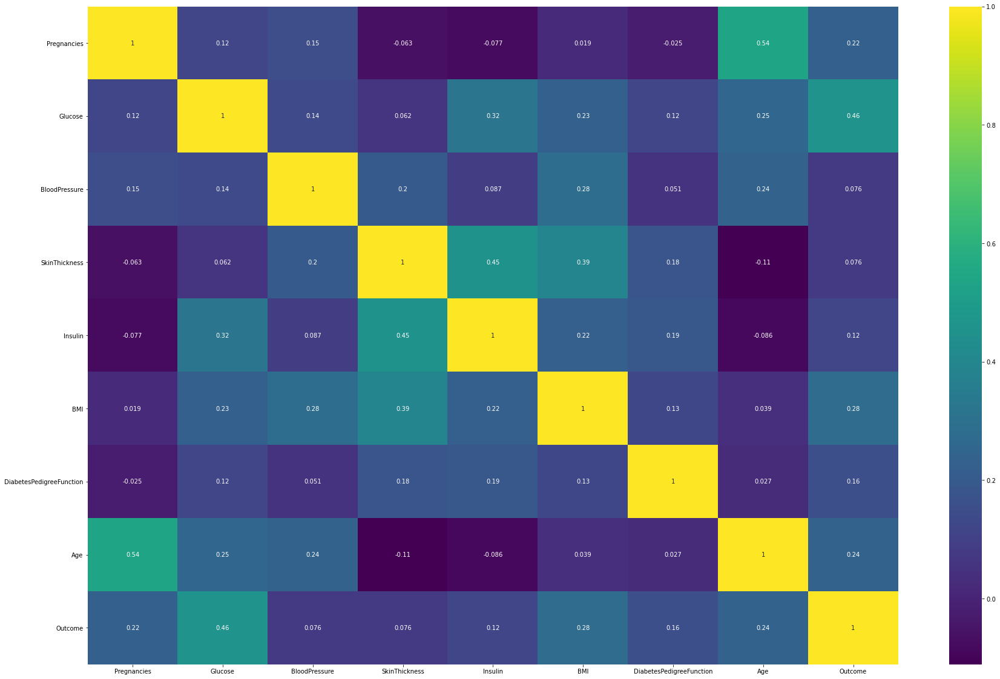

In [9]:
plt.subplots(figsize = (30,20))
corr = data.corr()
sns.heatmap(corr, annot = True, cmap = "viridis")
plt.show()

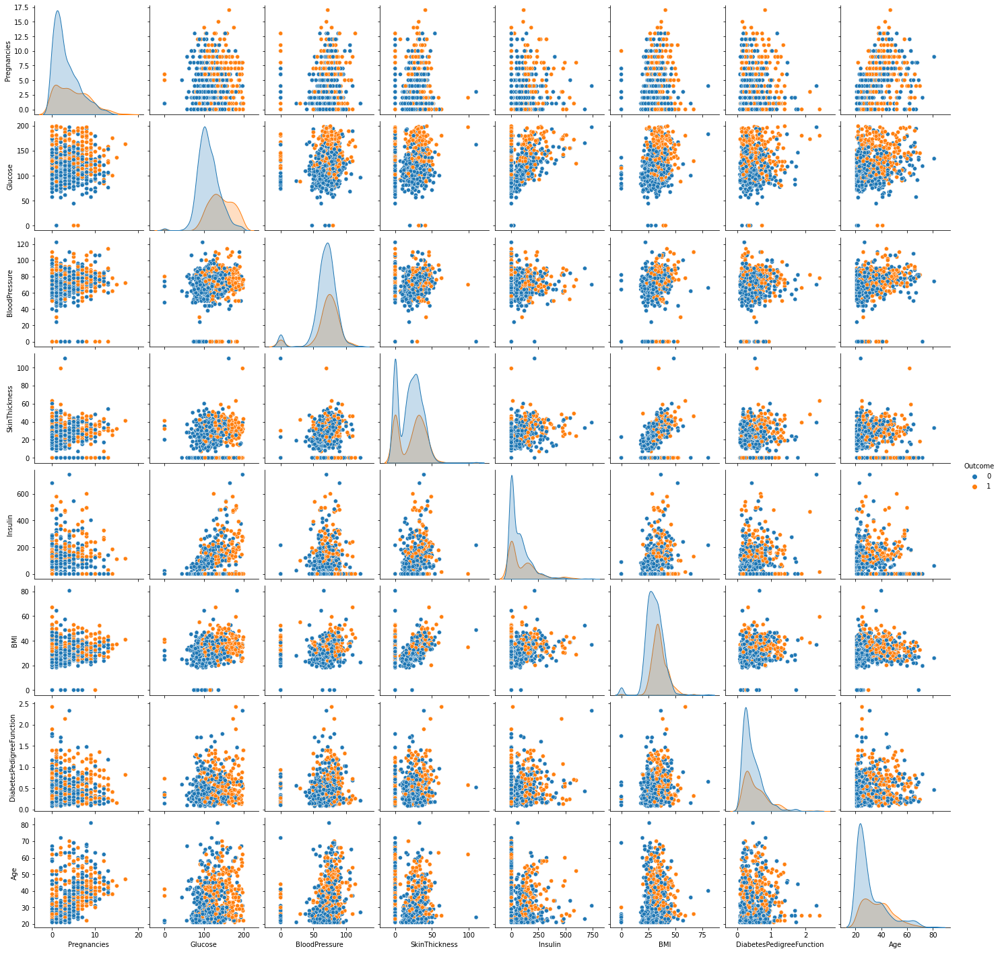

In [10]:
sns.pairplot(data, hue = "Outcome")
plt.show()

In [11]:
import plotly.graph_objects as go
fig = go.Figure()
fig = px.scatter_matrix(data, dimensions = ["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI"])
fig.update_layout(autosize=False,width=700,height=700,)
fig.show()

In [12]:
fig = px.histogram(data, x = "Age", color_discrete_sequence=["Green"], template = "plotly_white")
fig.show()

In [13]:
import plotly.express as px
fig = px.scatter(data.query("Outcome == 0"), x = "Glucose", y = "BloodPressure", size = "Insulin", log_x = True, size_max = 30, 
                 color = "Pregnancies")
fig.show()

In [14]:
fig = px.scatter(data.query("Outcome == 1"), x = "Glucose", y = "BloodPressure", size = "Insulin", log_x = True, size_max = 30, color = "Pregnancies")
fig.show()

In [15]:
fig = px.scatter(data, x = "Pregnancies", y = "Age", facet_row = "Outcome", color_discrete_sequence=["blueviolet"], template = "ggplot2")
fig.show()

In [16]:
fig.update_layout(autosize=False,width=1000,height=800, )
fig = px.box(data, x = "Age", y = "BMI", color_discrete_sequence=["orchid"], template="simple_white")
fig.show()

In [17]:
fig = px.parallel_categories(data, color = "BloodPressure")
fig.show()

In [18]:
fig = px.parallel_categories(data, color = "Glucose")
fig.show()

In [19]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
# Separating the dataset by data and labels

X = data.drop(columns = "Outcome")
y = data["Outcome"]

In [21]:
# Cross-checking the dataset X and y

print(X.shape)
print(y.shape)

(2000, 8)
(2000,)


### Train Test Split 

In [22]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size = 0.2)

In [23]:
scoring  = "accuracy"
num_folds = 10

print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(1600, 8) (400, 8)
(1600,) (400,)


In [24]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

models = []
models.append(('LR', LogisticRegression(solver='lbfgs', max_iter=10000)))
models.append(("RFC", RandomForestClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVR', SVC()))
models.append(('GB', GaussianNB()))

In [25]:
names = []
results = []


for name, model in models:
    kfold = model_selection.KFold(n_splits=10, random_state = None)
    cv_results = model_selection.cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    print(cv_results)
    
    results.append(cv_results)
    names.append(name)
    
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

[0.71875 0.74375 0.73125 0.8375  0.76875 0.7625  0.80625 0.74375 0.76875
 0.8    ]
LR: 0.768125 (0.035072)
[0.98125 0.9875  0.975   0.99375 0.9625  0.98125 0.96875 0.95625 0.9625
 0.96875]
RFC: 0.973750 (0.011456)
[0.725   0.775   0.74375 0.76875 0.76875 0.79375 0.80625 0.7375  0.80625
 0.84375]
KNN: 0.776875 (0.034579)
[0.71875 0.7375  0.76875 0.83125 0.76875 0.71875 0.7875  0.7375  0.7625
 0.79375]
SVR: 0.762500 (0.033889)
[0.70625 0.7375  0.69375 0.80625 0.7625  0.7375  0.79375 0.73125 0.7625
 0.775  ]
GB: 0.750625 (0.034284)


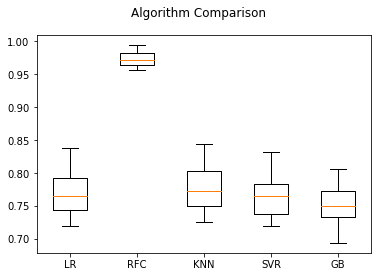

In [26]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [27]:
for name, model in models:
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)
    print(name)
    print(accuracy_score(y_test, prediction))
    print(classification_report(y_test, prediction))
    print("             ")

LR
0.8125
              precision    recall  f1-score   support

           0       0.84      0.90      0.86       268
           1       0.75      0.64      0.69       132

    accuracy                           0.81       400
   macro avg       0.79      0.77      0.78       400
weighted avg       0.81      0.81      0.81       400

             
RFC
0.965
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       268
           1       0.95      0.94      0.95       132

    accuracy                           0.96       400
   macro avg       0.96      0.96      0.96       400
weighted avg       0.96      0.96      0.96       400

             
KNN
0.8025
              precision    recall  f1-score   support

           0       0.85      0.86      0.85       268
           1       0.71      0.68      0.69       132

    accuracy                           0.80       400
   macro avg       0.78      0.77      0.77       400
weighted avg   

##### As the Accuracy rate of Random Forest Classifier is high compare to other model, we will go ahead with RFC.

In [28]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)
standardized_data = scaler.transform(X)

In [29]:
classifier = RandomForestClassifier(n_estimators=20)
classifier.fit(X_train, y_train)

RandomForestClassifier(n_estimators=20)

In [31]:
input_data = (4,110,92,0,0,37.6,0.191,30)

input_data_as_numpy = np.asarray(input_data)
input_data_reshaped = input_data_as_numpy.reshape(1,-1)
std_data = scaler.transform(input_data_reshaped)
print(std_data)

predictions = classifier.predict(std_data)
print(predictions)

if (predictions[0] == 0):
    print("The person is not Diabetic")
else:
    print("The person is Diabetic")

[[ 0.08970614 -0.34879241  1.1913613  -1.30037383 -0.72201552  0.66360959
  -0.86539266 -0.26227405]]
[0]
The person is not Diabetic


### Saving the Trained Model

In [32]:
import pickle

In [33]:
file_name = "diabetes_dataset_trained_model.sav"
pickle.dump(classifier, open(file_name, "wb"))

In [34]:
# Loading the saved model

load_model = pickle.load(open("diabetes_dataset_trained_model.sav", "rb"))

In [37]:
input_data = (4,110,92,0,0,37.6,0.191,30)

input_data_as_numpy = np.asarray(input_data)
input_data_reshaped = input_data_as_numpy.reshape(1,-1)

predictions = load_model.predict(std_data)
print(predictions)

if (predictions[0] == 0):
    print("The person is not Diabetic")
else:
    print("The person is Diabetic")

[0]
The person is not Diabetic
